In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


**RUN THIS FOR TPU RUNTIME**

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
print("Tensorflow version " + tf.__version__)

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.experimental.TPUStrategy(tpu)

**RUN THIS FOR GPU RUNTIME**

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


## Setup File for Keras Models

In [1]:
MAX_NB_WORDS = 40000 # max no. of words for tokenizer
MAX_SEQUENCE_LENGTH = 30 # max length of text (words) including padding
VALIDATION_SPLIT = 0.2
EMBEDDING_DIM = 200 # embedding dimensions for word vectors (word2vec/GloVe)
GLOVE_DIR = '/content/drive/My Drive/Data/glove.twitter.27B.200d.txt'
print("[i] Loaded Parameters:\n",
      MAX_NB_WORDS,MAX_SEQUENCE_LENGTH+5,
      VALIDATION_SPLIT,EMBEDDING_DIM,"\n",
      GLOVE_DIR)

[i] Loaded Parameters:
 40000 35 0.2 200 
 /content/drive/My Drive/Data/glove.twitter.27B.200d.txt


Imports:

In [3]:
print("[i] Importing Modules...")
!pip install np_utils

import numpy as np
import pandas as pd
import re, sys, os, csv, keras, pickle

from keras import regularizers, initializers, optimizers, callbacks
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils.np_utils import to_categorical
from keras.layers import Embedding
from keras.layers import Dense, Input, Flatten, Concatenate
from keras.layers import Conv1D, MaxPooling1D, Embedding, Dropout, LSTM, GRU, Bidirectional
from keras.models import Model
from keras import backend as K
from keras.engine.topology import Layer, InputSpec

print("[+] Using Keras version",keras.__version__)
print("[+] Finished Importing Modules")

[i] Importing Modules...
[+] Using Keras version 2.3.1
[+] Finished Importing Modules


## **OVER SAMPLING**

In [ ]:
df = pd.read_csv('/content/drive/My Drive/Data/data.csv', names = ['tweet', 'sentiment'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47288 entries, 0 to 47287
Data columns (total 2 columns):
tweet        47206 non-null object
sentiment    47288 non-null int64
dtypes: int64(1), object(1)
memory usage: 739.0+ KB


In [ ]:
labels = df[['sentiment']]
classes = sorted(labels.sentiment.unique())

In [ ]:
dfs = []
for sentiment in classes:
    df_temp = df.where(df.sentiment == sentiment)
    df_temp.dropna(axis=0, inplace=True)
    dfs.append(df_temp)

In [ ]:
ls = [len(df) for df in dfs]
print(ls)

[9573, 16293, 15931, 4300, 1109]


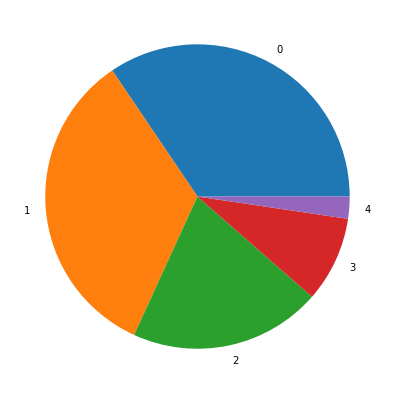

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 7))
plt.pie(labels.sentiment.value_counts(), labels=classes);

In [ ]:
new_dfs = [pd.concat([df]*int(max(ls)/len(df)), ignore_index=True) for df in dfs]
new_ls = [len(df) for df in new_dfs]
print(new_ls)

[9573, 16293, 15931, 12900, 15526]


In [ ]:
df = pd.concat(new_dfs, ignore_index=True)
print(df.shape, len(labels))

(70223, 2) 47288


In [ ]:
labels = df[['sentiment']]
print(labels.sentiment.value_counts())

1.0    16293
2.0    15931
4.0    15526
3.0    12900
0.0     9573
Name: sentiment, dtype: int64


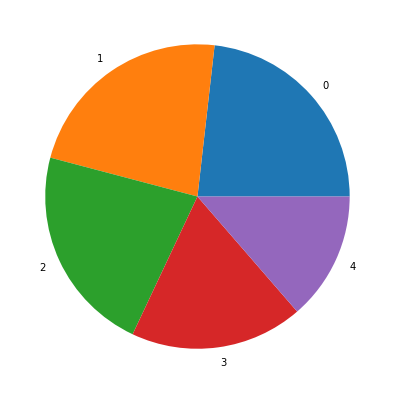

In [ ]:
plt.figure(figsize=(7, 7))
plt.pie(labels.sentiment.value_counts(), labels=classes);

In [ ]:
df.to_csv('/content/drive/My Drive/Data/data_oversampled.csv', header=None, index=False)

In [ ]:
dftempo = pd.read_csv('/content/drive/My Drive/Data/data_oversampled.csv', names = ['tweet', 'sentiment'])

In [ ]:
dftempo['sentiment'] = dftempo['sentiment'].astype(int)

In [ ]:
print(dftempo['sentiment'][0])

0


In [ ]:
dftempo.to_csv('/content/drive/My Drive/Data/data_oversampled.csv', header=None, index=False)

## **MODEL CREATION**

In [ ]:
texts, labels = [], []
print("[i] Reading from csv file...", end="")
with open('/content/drive/My Drive/Data/data_oversampled.csv') as csvfile:
    readCSV = csv.reader(csvfile, delimiter=',')
    for row in readCSV:
        texts.append(row[0])
        labels.append(row[1])
print("Done!")

[i] Reading from csv file...Done!


Convert text to word tokens (numbers that refer to the words)

In [ ]:
'''tokenizer = Tokenizer(num_words=MAX_NB_WORDS)
tokenizer.fit_on_texts(texts)
with open('/content/drive/My Drive/Models_OS/tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)
print("[i] Saved word tokenizer to file: tokenizer.pickle")'''

[i] Saved word tokenizer to file: tokenizer.pickle


In [ ]:
with open('/content/drive/My Drive/Models_OS/tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

Convert tweets to sequences of word tokens with zero padding at the front and back

In [ ]:
sequences = tokenizer.texts_to_sequences(texts)
word_index = tokenizer.word_index
print('[i] Found %s unique tokens.' % len(word_index))
data_int = pad_sequences(sequences, padding='pre', maxlen=(MAX_SEQUENCE_LENGTH-5))
data = pad_sequences(data_int, padding='post', maxlen=(MAX_SEQUENCE_LENGTH))

[i] Found 34359 unique tokens.


In [ ]:
labels = to_categorical(np.asarray(labels)) # convert to one-hot encoding vectors
print('[+] Shape of data tensor:', data.shape)
print('[+] Shape of label tensor:', labels.shape)

[+] Shape of data tensor: (70223, 30)
[+] Shape of label tensor: (70223, 5)


In [ ]:
indices = np.arange(data.shape[0])
np.random.shuffle(indices)
data = data[indices]
labels = labels[indices]
nb_validation_samples = int(VALIDATION_SPLIT * data.shape[0])

In [ ]:
x_train = data[:-nb_validation_samples]
y_train = labels[:-nb_validation_samples]
x_val = data[-nb_validation_samples:]
y_val = labels[-nb_validation_samples:]

print('[i] Number of entries in each category:')
print("[+] Training:\n",y_train.sum(axis=0))
print("[+] Validation:\n",y_val.sum(axis=0))

[i] Number of entries in each category:
[+] Training:
 [ 7677. 13061. 12649. 10364. 12428.]
[+] Validation:
 [1896. 3232. 3282. 2536. 3098.]


In [ ]:
print(len(x_train))

56179


### Preparing the Embedding layer

In [ ]:
embeddings_index = {}
f = open(GLOVE_DIR)
print("[i] Loading GloVe from:",GLOVE_DIR,"...",end="")
for line in f:
    values = line.split()
    word = values[0]
    embeddings_index[word] = np.asarray(values[1:], dtype='float32')
f.close()
print("Done.\n[+] Proceeding with Embedding Matrix...", end="")
embedding_matrix = np.random.random((len(word_index) + 1, EMBEDDING_DIM))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector
print("[i] Completed!")

[i] Loading GloVe from: /content/drive/My Drive/Data/glove.twitter.27B.200d.txt ...Done.
[+] Proceeding with Embedding Matrix...[i] Completed!


In [ ]:
# second embedding matrix for non-static channel
embedding_matrix_ns = np.random.random((len(word_index) + 1, EMBEDDING_DIM))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix_ns[i] = embedding_vector
print("Completed!")

Completed!


In [ ]:
sequence_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

# static channel
embedding_layer_frozen = Embedding(len(word_index) + 1,
                            EMBEDDING_DIM,
                            weights=[embedding_matrix],
                            input_length=MAX_SEQUENCE_LENGTH,
                            trainable=False)
embedded_sequences_frozen = embedding_layer_frozen(sequence_input)

# non-static channel
embedding_layer_train = Embedding(len(word_index) + 1,
                            EMBEDDING_DIM,
                            weights=[embedding_matrix_ns],
                            input_length=MAX_SEQUENCE_LENGTH,
                            trainable=True)
embedded_sequences_train = embedding_layer_train(sequence_input)

In [ ]:
l_lstm1f = Bidirectional(LSTM(6,return_sequences=True,dropout=0.3, recurrent_dropout=0.0))(embedded_sequences_frozen)
l_lstm1t = Bidirectional(LSTM(6,return_sequences=True,dropout=0.3, recurrent_dropout=0.0))(embedded_sequences_train)
l_lstm1 = Concatenate(axis=1)([l_lstm1f, l_lstm1t])

In [ ]:
l_conv_2 = Conv1D(filters=24,kernel_size=2,activation='relu')(l_lstm1)
l_conv_2 = Dropout(0.3)(l_conv_2)
l_conv_3 = Conv1D(filters=24,kernel_size=3,activation='relu')(l_lstm1)
l_conv_3 = Dropout(0.3)(l_conv_3)

l_conv_5 = Conv1D(filters=24,kernel_size=5,activation='relu',)(l_lstm1)
l_conv_5 = Dropout(0.3)(l_conv_5)
l_conv_6 = Conv1D(filters=24,kernel_size=6,activation='relu',kernel_regularizer=regularizers.l2(0.0001))(l_lstm1)
l_conv_6 = Dropout(0.3)(l_conv_6)

l_conv_8 = Conv1D(filters=24,kernel_size=8,activation='relu',kernel_regularizer=regularizers.l2(0.0001))(l_lstm1)
l_conv_8 = Dropout(0.3)(l_conv_8)

conv_1 = [l_conv_6,l_conv_5, l_conv_8,l_conv_2,l_conv_3]

l_lstm_c = Concatenate(axis=1)(conv_1)

In [ ]:
l_conv_4f = Conv1D(filters=12,kernel_size=4,activation='relu',kernel_regularizer=regularizers.l2(0.0001))(embedded_sequences_frozen)
l_conv_4f = Dropout(0.3)(l_conv_4f)
l_conv_4t = Conv1D(filters=12,kernel_size=4,activation='relu',kernel_regularizer=regularizers.l2(0.0001))(embedded_sequences_train)
l_conv_4t = Dropout(0.3)(l_conv_4t)

l_conv_3f = Conv1D(filters=12,kernel_size=3,activation='relu',)(embedded_sequences_frozen)
l_conv_3f = Dropout(0.3)(l_conv_3f)
l_conv_3t = Conv1D(filters=12,kernel_size=3,activation='relu',)(embedded_sequences_train)
l_conv_3t = Dropout(0.3)(l_conv_3t)

l_conv_2f = Conv1D(filters=12,kernel_size=2,activation='relu')(embedded_sequences_frozen)
l_conv_2f = Dropout(0.3)(l_conv_2f)
l_conv_2t = Conv1D(filters=12,kernel_size=2,activation='relu')(embedded_sequences_train)
l_conv_2t = Dropout(0.3)(l_conv_2t)

conv_2 = [l_conv_4f, l_conv_4t,l_conv_3f, l_conv_3t, l_conv_2f, l_conv_2t]

l_merge_2 = Concatenate(axis=1)(conv_2)
l_c_lstm = Bidirectional(LSTM(12,return_sequences=True,dropout=0.3, recurrent_dropout=0.0))(l_merge_2)

In [ ]:
l_merge = Concatenate(axis=1)([l_lstm_c, l_c_lstm])
l_pool = MaxPooling1D(4)(l_merge)
l_drop = Dropout(0.5)(l_pool)
l_flat = Flatten()(l_drop)
l_dense = Dense(26, activation='relu')(l_flat)
preds = Dense(5, activation='softmax')(l_dense)

In [ ]:
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

In [ ]:
model = Model(sequence_input, preds)
adadelta = optimizers.Adadelta(lr=0.9, rho=0.95, epsilon=None, decay=0.002)
lr_metric = get_lr_metric(adadelta)
model.compile(loss='categorical_crossentropy',
              optimizer=adadelta,
              metrics=['acc'])

In [ ]:
def initial_boost(epoch):
    if epoch==0: return float(8.0)
    elif epoch==1: return float(4.0)
    elif epoch==2: return float(2.0)
    elif epoch==3: return float(1.5)
    else: return float(1.0)

In [ ]:
tensorboard = callbacks.TensorBoard(log_dir='/content/drive/My Drive/ModelFinal/logs', histogram_freq=0, batch_size=16, write_grads=True , write_graph=True)
model_checkpoints = callbacks.ModelCheckpoint("/content/drive/My Drive/ModelFinal/checkpoint-{val_acc:.3f}.h5", monitor='val_acc', verbose=0, save_best_only=True, save_weights_only=False, mode='auto', period=0)
lr_schedule = callbacks.LearningRateScheduler(initial_boost)

In [ ]:
model.summary()
model.save('/content/drive/My Drive/Models_OS/EmotionalModeling_LSTM-CNN.h5')

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 30)]         0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 30, 200)      6872000     input_1[0][0]                    
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 30, 200)      6872000     input_1[0][0]                    
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 30, 12)       9936        embedding[0][0]                  
______________________________________________________________________________________________

In [ ]:
model = tensorflow.keras.models.load_model("/content/drive/My Drive/ModelsFinal/checkpoint-0.740.h5")

In [ ]:
print("Training Progress:")
model_log = model.fit(x_train, y_train, validation_data=(x_val, y_val),
          epochs=10, batch_size=32,
          callback=[tensorboard, model_checkpoints])

pd.DataFrame(model_log.history).to_csv("/content/drive/My Drive/ModelFinal/history-balance.csv", index = False)

Training Progress:
Epoch 1/10
1756/1756 [==============================] - 1611s 917ms/step - loss: 0.6655 - acc: 0.7296 - val_loss: 0.6248 - val_acc: 0.7435
Epoch 2/10
1756/1756 [==============================] - 1590s 906ms/step - loss: 0.6292 - acc: 0.7441 - val_loss: 0.6073 - val_acc: 0.7489
Epoch 3/10
1756/1756 [==============================] - 1534s 874ms/step - loss: 0.6169 - acc: 0.7482 - val_loss: 0.6027 - val_acc: 0.7511
Epoch 4/10
1756/1756 [==============================] - 1516s 863ms/step - loss: 0.6082 - acc: 0.7532 - val_loss: 0.6010 - val_acc: 0.7539
Epoch 5/10
1756/1756 [==============================] - 1511s 860ms/step - loss: 0.6029 - acc: 0.7551 - val_loss: 0.5972 - val_acc: 0.7561
Epoch 6/10
1756/1756 [==============================] - 1507s 858ms/step - loss: 0.5975 - acc: 0.7574 - val_loss: 0.5979 - val_acc: 0.7553
Epoch 7/10
 178/1756 [==>...........................] - ETA: 22:35 - loss: 0.6070 - acc: 0.7560

KeyboardInterrupt: ignored

### **MANUAL MODEL SAVE (OPTIONAL)**

In [ ]:
model.save('/content/drive/My Drive/ModelFinal/checkpoint-0.740.h5')

### **MANUAL MODEL LOAD (OPTIONAL)**

In [ ]:
model_loaded = tensorflow.keras.models.load_model("/content/drive/My Drive/ModelFinal/checkpoint-0.740.h5")
model_loaded.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 30)]         0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 30, 200)      6872000     input_1[0][0]                    
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 30, 200)      6872000     input_1[0][0]                    
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 30, 12)       9936        embedding[0][0]                  
______________________________________________________________________________________________

In [ ]:
results = model_loaded.evaluate(x_train, y_train, batch_size = 128)
print('test loss, test acc:', results)

439/439 [==============================] - 38s 86ms/step - loss: 0.5492 - acc: 0.7799
test loss, test acc: [0.549163818359375, 0.7798821330070496]


## **TENSORBOARD ANALYSIS** (Optional)

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
lo = '/content/drive/My Drive/ModelsFinal/logs/train'
tensorboard_callback = callbacks.TensorBoard(logdir, histogram_freq=1)

In [ ]:
!kill 445

In [ ]:
%tensorboard --logdir '/content/drive/My Drive/ModelsFinal/logs/train/'

Output hidden; open in https://colab.research.google.com to view.

## **PREDICTION**

In [4]:
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
%config InlineBackend.figure_format = 'retina'
import itertools, pickle
import pandas as pd

with open('D:/Anant/Model/tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

classes = ["neutral", "happy", "sad", "hate","anger"]

In [ ]:
#model_test = load_model('checkpoint-0.866.h5')
model_test = load_model('D:/Anant/ModelFinal/checkpoint-0.740.h5')
Y_test = np.argmax(y_val, axis=1) # Convert one-hot to index
y_pred = model_test.predict(x_val)
y_pred_class = np.argmax(y_pred,axis=1)
cnf_matrix = confusion_matrix(Y_test, y_pred_class)

In [ ]:
print(classification_report(Y_test, y_pred_class, target_names=classes))

              precision    recall  f1-score   support

     neutral       0.51      0.40      0.45      1896
       happy       0.67      0.72      0.69      3232
         sad       0.64      0.69      0.66      3282
        hate       0.91      0.86      0.88      2536
       anger       1.00      1.00      1.00      3098

    accuracy                           0.76     14044
   macro avg       0.74      0.73      0.74     14044
weighted avg       0.75      0.76      0.75     14044



In [ ]:
text = ["I salute you for the bravery and sacrifice! A true hero indeed.",
        "I am sorry but I trust HRW I damned sight more than the PAP and it's cronies! Off course the PAP will say that they (HRW) made things up...despite of the fact that SG is a dictator state!?",
        "PAP are taking the piss again!",
        "Thought he sold his kidney to buy it; Instead, he bought a kidney then bought the car Filthy rich This is why we need communism",
        "Somebody needs to water Tharman's head, hair needs to be grown there",
        "what a nuisance fk. a proper clean and flat footpath,,now obstructed by sharedbikes..! which idiotic MP allowed this to happen?",
        "What baby bonus scheme ??? To grow up a kid in Singapore you think is easy now bo ??? Both parent need to work to grow up a kid until 21 , you think tats easy bo ??? Think la",
        "I am so pumped, it cannot get better than this!!",
        "This is complete bull shit!! Cannot believe that the goverment can be this careless!!",
        "Melaporkan banjir gak harus berendam di air banjir, melaporkan virus Corona gak harus pake masker.  ðŸ˜Š",
        "Since the Corona virus has been trending all day, just a quick 5 minute sketch of a friendly reminder #coronavirus #StaySafe",
        "man this corona shit is deadass scary but buying all supplies without thinking other ppl also needs to survive is scarier bcs if all ppl in your area dies and u survived alone u can't even swipe right on tinder u fucking selfish mammals"
       ]

In [ ]:
model_predict = load_model('D:/Anant/ModelFinal/checkpoint-0.740.h5')

In [ ]:
dataDir = "D:/Anant/"
#titleList = ['Politics_Preprocessed', 'Corona_Preprocessed', 'Sports_Preprocessed']
titleList = ['Sports_Preprocessed']
for title in titleList:
    sentiments = []
    print("Predicting " +  dataDir + title + '.csv')
    dataDf = pd.read_csv(dataDir+title+'.csv')
    sequences_test = tokenizer.texts_to_sequences(dataDf['tweet'].astype(str))
    data_int_t = pad_sequences(sequences_test, padding='pre', maxlen=(MAX_SEQUENCE_LENGTH-5))
    data_test = pad_sequences(data_int_t, padding='post', maxlen=(MAX_SEQUENCE_LENGTH))
    print("Starting main prediction...")
    print(len(data_test))
    y_prob = model.predict(data_test)
    print("main prediction ends...")
    for n, prediction in enumerate(y_prob):
        pred = y_prob.argmax(axis=-1)[n]
        sentiments.append(classes[pred])
        #print(dataDf['tweet'][n],"\nPrediction:",classes[pred],"\n")
    #print(sentiments)
    dataDf['sentiment'] = sentiments
    dataDf.to_csv(dataDir+title+'_Emotion.csv')
    print("Created " +  dataDir + title + '_Emotion.csv')

Predicting D:/Anant/Sports_Preprocessed.csv
Starting main prediction...
412333
main prediction ends...


## **PREDICTION WITH TOPIC WISE DATA**

In [5]:
model_predict = load_model('D:/Anant/ModelFinal/checkpoint-0.740.h5')

In [11]:
from os import listdir
from IPython.display import clear_output

predictedFilesPath = []
unPredictedFilesPath = []
predictedDataDir = 'D:/Anant/TMEmotional/Predicted/'
unPredictedDataDir = 'D:/Anant/TMEmotional/UnPredicted/'
titleList = ['Politics', 'Sports']
dateList = ['01-03-2020', '02-03-2020', '03-03-2020', '04-03-2020', '05-03-2020', '06-03-2020', '07-03-2020', '08-03-2020', '09-03-2020', '10-03-2020', 
            '11-03-2020', '12-03-2020', '13-03-2020', '14-03-2020', '15-03-2020', '16-03-2020', '17-03-2020', '18-03-2020', '19-03-2020', '20-03-2020', 
            '21-03-2020', '22-03-2020', '23-03-2020', '24-03-2020']

for title in titleList:
    for date in dateList:
        predictedFilesPath.append(predictedDataDir+title+'/'+date+'/')
        unPredictedFilesPath.append(unPredictedDataDir+title+'/'+date+'/')

'''print(unPredictedFilesPath)
print(predictedFilesPath)'''
print(len(unPredictedFilesPath))
print(len(predictedFilesPath))

48
48


In [ ]:
l = len(unPredictedFilesPath)
for i in range(l):
    filesList = listdir(unPredictedFilesPath[i])
    for f in filesList:
        sentiments = []
        print("Predicting " +  unPredictedFilesPath[i] + f)
        dataDf = pd.read_csv(unPredictedFilesPath[i] + f, names = ['0'])
        dataDf.rename(columns = {'0':'tweet'}, inplace = True)
        sequences_test = tokenizer.texts_to_sequences(dataDf['tweet'].astype(str))
        data_int_t = pad_sequences(sequences_test, padding='pre', maxlen=(MAX_SEQUENCE_LENGTH-5))
        data_test = pad_sequences(data_int_t, padding='post', maxlen=(MAX_SEQUENCE_LENGTH))
        y_prob = model_predict.predict(data_test)
        for n, prediction in enumerate(y_prob):
            pred = y_prob.argmax(axis=-1)[n]
            sentiments.append(classes[pred])
            #print(text[n],"\nPrediction:",classes[pred],"\n")
        dataDf['sentiment'] = sentiments
        dataDf.to_csv(predictedFilesPath[i] + f, index = False)
        print("Created " +  predictedFilesPath[i] + f)
        clear_output(wait=True)

In [1]:
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import seaborn as sns
sns.set()
import pandas as pd

from os import listdir
from IPython.display import clear_output

In [6]:
predictedFilesPath = []
unPredictedFilesPath = []
predictedDataDir = 'D:/MS COMPUTER SCIENCE/TMEmotional/Predicted/'
unPredictedDataDir = 'D:/MS COMPUTER SCIENCE/TMEmotional/UnPredicted/'
#titleList = ['Politics', 'Sports']
titleList = ['Politics', 'Sports', 'Corona']
dateList = ['01-03-2020', '02-03-2020', '03-03-2020', '04-03-2020', '05-03-2020', '06-03-2020', '07-03-2020', '08-03-2020', '09-03-2020', '10-03-2020', 
            '11-03-2020', '12-03-2020', '13-03-2020', '14-03-2020', '15-03-2020', '16-03-2020', '17-03-2020', '18-03-2020', '19-03-2020', '20-03-2020', 
            '21-03-2020', '22-03-2020', '23-03-2020', '24-03-2020']

for title in titleList:
    for date in dateList:
        predictedFilesPath.append(predictedDataDir+title+'/'+date+'/')
        unPredictedFilesPath.append(unPredictedDataDir+title+'/'+date+'/')

'''print(unPredictedFilesPath)
print(predictedFilesPath)'''
print(len(unPredictedFilesPath))
print(len(predictedFilesPath))

72
72


In [24]:
import bs4

vizFilesPath = []
vizDataDir = 'D:/MS COMPUTER SCIENCE/MS PROJECTS/MAIN PROJECT/Visualization/'
titleList = ['politics', 'sports', 'corona']
dateList = ['1 (1).html', '1 (2).html', '1 (3).html', '1 (4).html', '1 (5).html', '1 (6).html', '1 (7).html', '1 (8).html', '1 (9).html', '1 (10).html', 
            '1 (11).html', '1 (12).html', '1 (13).html', '1 (14).html', '1 (15).html', '1 (16).html', '1 (17).html', '1 (18).html', '1 (19).html', '1 (20).html', 
            '1 (21).html', '1 (22).html', '1 (23).html', '1 (24).html']

for title in titleList:
    for date in dateList:
        vizFilesPath.append(vizDataDir+title+'/'+date)

#print(vizFilesPath)
print(len(vizFilesPath))

72


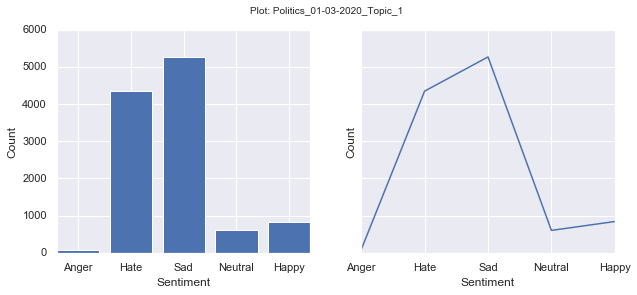

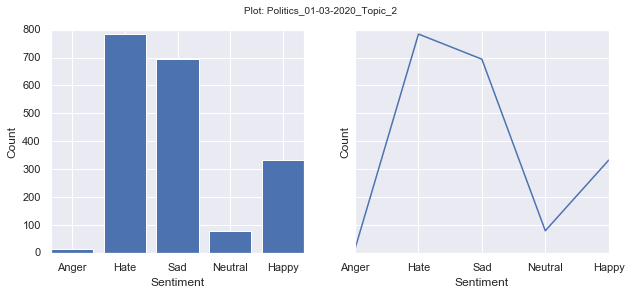

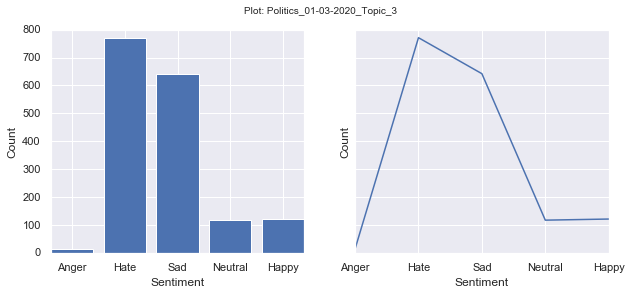

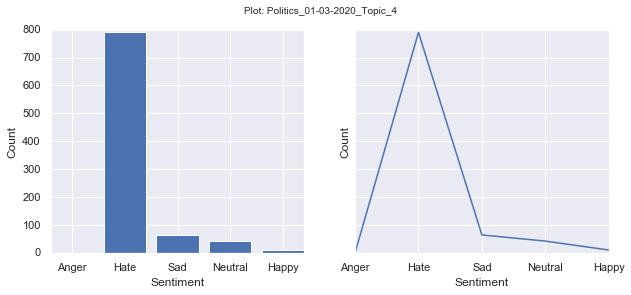

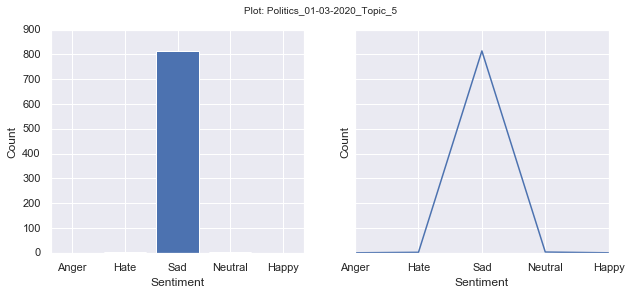

...

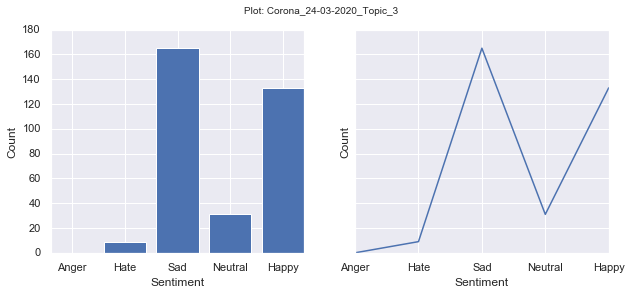

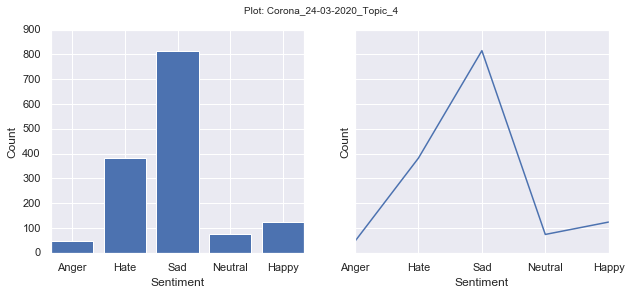

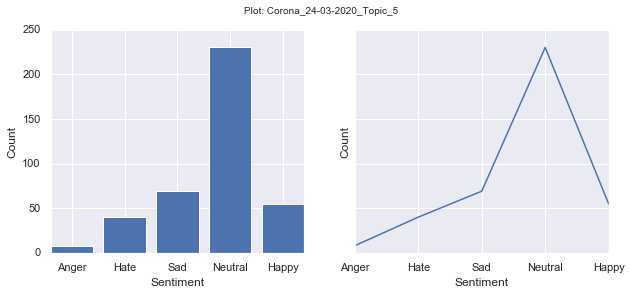

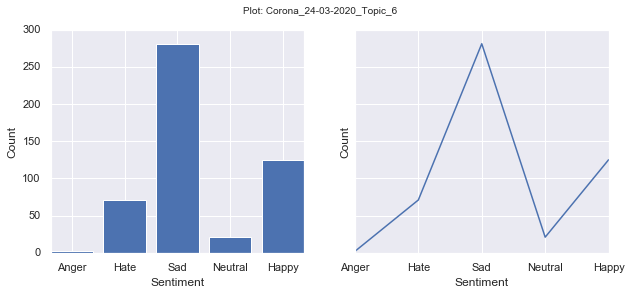

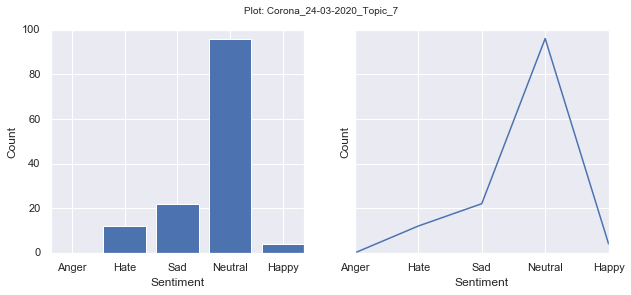

In [25]:
l = len(predictedFilesPath)
for i in range(l):
    filesList = listdir(predictedFilesPath[i])
    
    # load the file
    with open(vizFilesPath[i]) as inf:
        txt = inf.read()
        
    k = 1
    appendHtml = '<link rel="stylesheet" href="https://maxcdn.bootstrapcdn.com/bootstrap/4.4.1/css/bootstrap.min.css">' + '<script src="https://ajax.googleapis.com/ajax/libs/jquery/3.4.1/jquery.min.js"></script>' + '<script src="https://cdnjs.cloudflare.com/ajax/libs/popper.js/1.16.0/umd/popper.min.js"></script>' + '<script src="https://maxcdn.bootstrapcdn.com/bootstrap/4.4.1/js/bootstrap.min.js"></script>' + '<div class="container" style="margin-top:0px; width: 100%; padding: 0;">' + '<div class="row" style="width: 100%; margin: 0; padding: 0;">'
    
    for f in filesList:
        clear_output(wait=True)
        if f.endswith(".csv"):
            print("Plotting " +  predictedFilesPath[i] + f)
            dataDf = pd.read_csv(predictedFilesPath[i] + f)

            data = {'Anger': len(dataDf[dataDf['sentiment']=='anger']), 'Hate': len(dataDf[dataDf['sentiment']=='hate']),
                    'Sad': len(dataDf[dataDf['sentiment']=='sad']), 'Neutral': len(dataDf[dataDf['sentiment']=='neutral']), 
                    'Happy' : len(dataDf[dataDf['sentiment']=='happy'])}

            x_axis = list(data.keys())
            y_axis = list(data.values())

            fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
            fig.suptitle('Plot: '+ f[:-5] + str(k))
            axs[0].bar(x_axis, y_axis)
            axs[1].plot(x_axis, y_axis)
            
            for ax in axs.flat:
                ax.set(xlabel='Sentiment', ylabel='Count')
            
            saveLoc = predictedFilesPath[i] + f[:-5] + str(k) + '_Final.jpg'
            plt.savefig(saveLoc)
            
            appendHtml = appendHtml + '<div class="emotionalModeling col-sm-6">' + '<img src="'+ saveLoc +'">' + '</div>'
            k = k + 1
    
    #style = '<link href="essential.css" rel="stylesheet"/>'
    txt = txt + appendHtml + '</div>' + '</div><link href="essential.css" rel="stylesheet"/>'
    soup = bs4.BeautifulSoup(txt)
    
    #print(txt)
    # save the file again
    with open(vizFilesPath[i], "w") as outf:
        outf.write(str(soup))

In [23]:
print(txt)

<html><head><link href="https://cdn.rawgit.com/bmabey/pyLDAvis/files/ldavis.v1.0.0.css" rel="stylesheet" type="text/css"/>
<link href="new 2.css" rel="stylesheet"/>
</head><body><div class="topnav">
<a class="active" href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\Corona.html">Home</a>
<a href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\1 (1).html" target="_blank">Day 1</a>
<a href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\1 (2).html" target="_blank">Day 2</a>
<a href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\1 (3).html" target="_blank">Day 3</a>
<a href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\1 (4).html" target="_blank">Day 4</a>
<a href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\1 (5).html" target="_blank">Day 5</a>
<a href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\1 (6).html" target="_blank">Day 6</a>
<a href="C:\Users\hp\Desktop\MS PROJECT\Corona LDA\Corona html\1 (7).html" target="_blank">Day 

In [ ]:
l = len(predictedFilesPath)
for i in range(l):
    filesList = listdir(predictedFilesPath[i])
    k = 1
    for f in filesList:
        clear_output(wait=True)
        if f.endswith(".csv"):
            print("Plotting " +  predictedFilesPath[i] + f)
            dataDf = pd.read_csv(predictedFilesPath[i] + f)

            data = {'Anger': len(dataDf[dataDf['sentiment']=='anger']), 'Hate': len(dataDf[dataDf['sentiment']=='hate']),
                    'Sad': len(dataDf[dataDf['sentiment']=='sad']), 'Neutral': len(dataDf[dataDf['sentiment']=='neutral']), 
                    'Happy' : len(dataDf[dataDf['sentiment']=='happy'])}

            x_axis = list(data.keys())
            y_axis = list(data.values())

            fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
            fig.suptitle('Plot: '+ f[:-5] + str(k))
            axs[0].bar(x_axis, y_axis)
            axs[1].plot(x_axis, y_axis)
            
            for ax in axs.flat:
                ax.set(xlabel='Sentiment', ylabel='Count')
                
            '''fig, axs = plt.subplots(figsize=(8, 5), sharey=True)
            fig.suptitle('Plot: '+ f[:-4])
            axs.bar(x_axis, y_axis)
            ax.set(xlabel='Sentiment', ylabel='Count')

            fig.savefig(predictedFilesPath[i] + f[:-4]+ '_Histogram.jpg')
            fig.savefig('D:/MS COMPUTER SCIENCE/TMEmotional/Plots' + f[:-4]+ '.jpg')'''
            
            '''sns_plot = sns.distplot(dataDf.sentiment)
            sns_plot.savefig(predictedFilesPath[i] + f[:-4]+ '_distplot.jpg')'''

            #plt.hist(dataDf['sentiment'], alpha=0.5)
            plt.savefig(predictedFilesPath[i] + f[:-5] + str(k) + '_Final.jpg')
            k = k + 1